<h2>Neural Style Transfer</h2>

This cell imports essential libraries for the neural style transfer project:
- **torch** and **torch.optim** from PyTorch for deep learning and optimization.
- **torchvision.models** and **torchvision.transforms** for pre-trained models and image preprocessing.
- **PIL.Image** for image loading and manipulation.
- **matplotlib.pyplot** for visualizing images during training.


In [1]:
import torch
import torch.optim as optim
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt

This cell defines the `load_image` function, which loads and preprocesses an image:
- Resizes the image to `max_size` or a specified `shape`.
- Converts the image to a tensor and normalizes it using standard mean and standard deviation values for VGG models.
- Adds a batch dimension to prepare the image for model input.


In [2]:
# Load and preprocess image
def load_image(image_path, max_size=400, shape=None):
    image = Image.open(image_path)
    transform = transforms.Compose([
        transforms.Resize(max_size if shape is None else shape),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
    image = transform(image).unsqueeze(0)  # Add batch dimension
    return image

Defines the `im_convert` function, which converts a tensor back to a PIL image for visualization:
- Reverses the normalization applied during preprocessing.
- Clips values to ensure they are in the valid range for display.


In [3]:
def im_convert(tensor):
    image = tensor.clone().detach().cpu().squeeze(0)
    image = image * torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1) + torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    image = image.clamp(0, 1)
    return transforms.ToPILImage()(image)


Defines the `get_vgg_model` function, which loads the pre-trained VGG-19 model for feature extraction:
- Sets the model to evaluation mode.
- Disables gradient computation for model parameters.
- Only the model's feature layers are used.


In [4]:
def get_vgg_model():
    vgg = models.vgg19(pretrained=True).features.eval()
    for param in vgg.parameters():
        param.requires_grad = False
    return vgg


This cell defines the `get_features` function to extract content and style features from specific layers of the VGG-19 model:
- By default, uses layers from different blocks of the VGG-19 model for both content and style.
- Stores extracted features in a dictionary.


In [5]:
def get_features(image, model, layers=None):
    if layers is None:
        layers = {'0': 'conv1_1', '5': 'conv2_1', '10': 'conv3_1',
                  '19': 'conv4_1', '21': 'conv4_2', '28': 'conv5_1'}
    features = {}
    x = image
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
    return features

Defines the `gram_matrix` function, which computes the Gram matrix for style feature tensors:
- Calculates correlations between filters by reshaping the tensor, then performing a matrix multiplication.
- Normalizes the matrix to ensure consistency regardless of image size.


In [6]:
def gram_matrix(tensor):
    if len(tensor.size()) == 4:
        _, n_filters, h, w = tensor.size()
        tensor = tensor.view(n_filters, h * w)
    elif len(tensor.size()) == 3:  # If there is no batch dimension, handle it
        n_filters, h, w = tensor.size()
        tensor = tensor.view(n_filters, h * w)
    else:
        raise ValueError(f"Expected 4D or 3D tensor, got {tensor.size()}")

    gram = torch.mm(tensor, tensor.t())
    return gram / (n_filters * h * w)


This cell defines functions for calculating content and style losses:
- `calculate_content_loss`: Computes mean squared error between the target and content features.
- `calculate_style_loss`: Computes the mean squared error between the Gram matrices of the target and style features.


In [7]:
def calculate_content_loss(target, content):
    return torch.mean((target - content)**2)

def calculate_style_loss(target, style_gram):
    target_gram = gram_matrix(target)  # Compute the Gram matrix for the target image
    return torch.mean((target_gram - style_gram)**2)


Loads the content and style images, preprocesses them, and transfers them to the device (CPU or GPU) for computation.
- Ensures the style image is reshaped to match the content image’s dimensions.


In [8]:

content_img = load_image("Content_Test_4.jpg").to("cuda" if torch.cuda.is_available() else "cpu")
style_img = load_image("Style_Test_4.jpg", shape=content_img.shape[-2:]).to("cuda" if torch.cuda.is_available() else "cpu")


vgg = get_vgg_model().to("cuda" if torch.cuda.is_available() else "cpu")
content_features = get_features(content_img, vgg)
style_features = get_features(style_img, vgg)


style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}


target = content_img.clone().requires_grad_(True).to("cuda" if torch.cuda.is_available() else "cpu")


optimizer = optim.Adam([target], lr=0.003)


style_weight = 1e6
content_weight = 1

/opt/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Initializes the VGG-19 model and extracts features for both the content and style images.
- Computes the Gram matrices for style features in preparation for style loss calculations.

Creates a copy of the content image as the starting target image and enables gradient tracking.
- Sets up an Adam optimizer to adjust the target image.

Sets the weights for style and content loss, and the number of training steps.
- `style_weight`: Controls the influence of style on the generated image.
- `content_weight`: Controls the influence of content on the generated image.

The main training loop performs the following steps:
- Extracts features from the target image.
- Calculates the content and style losses.
- Combines losses with weights for a total loss.
- Backpropagates and optimizes to minimize the total loss.
- Displays the image and loss value every 100 steps for progress tracking.


Step 100, Total Loss: 24.25884246826172


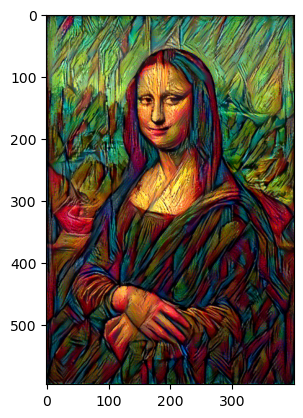

Step 200, Total Loss: 23.779075622558594


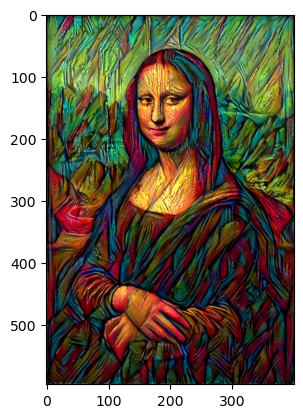

Step 300, Total Loss: 23.324077606201172


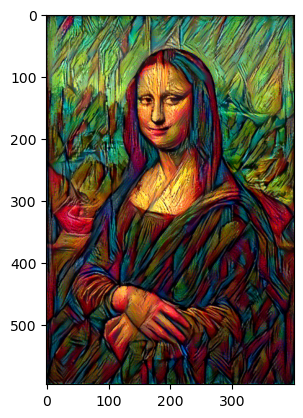

Step 400, Total Loss: 22.892074584960938


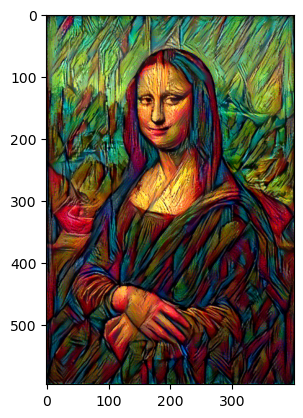

Step 500, Total Loss: 22.48236083984375


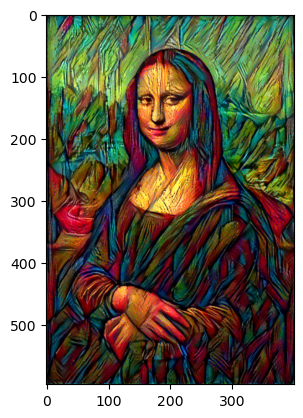

Step 600, Total Loss: 22.093841552734375


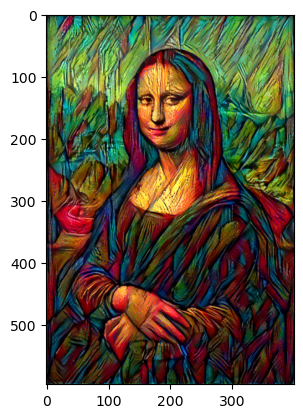

Step 700, Total Loss: 21.725069046020508


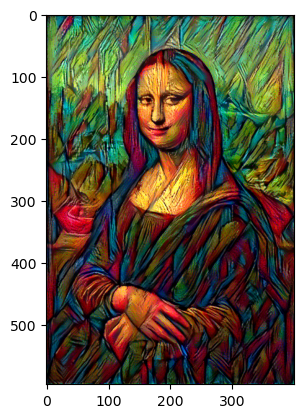

Step 800, Total Loss: 21.376028060913086


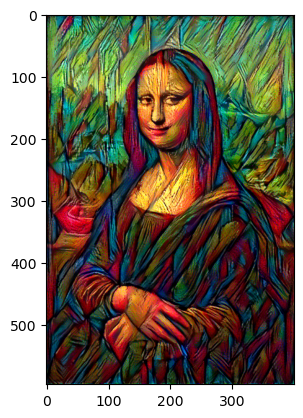

Step 900, Total Loss: 21.046615600585938


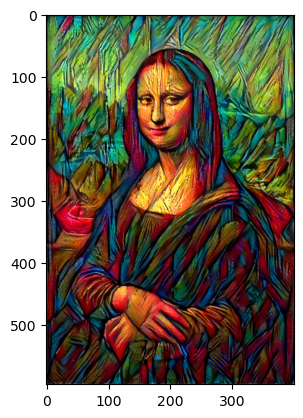

Step 1000, Total Loss: 20.73598861694336


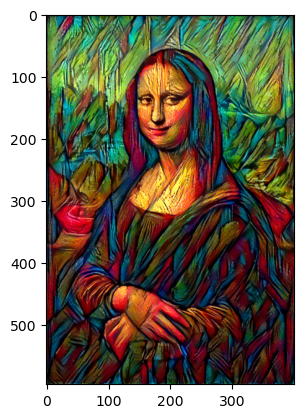

Step 1100, Total Loss: 20.443954467773438


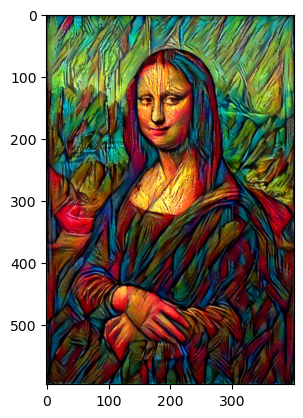

Step 1200, Total Loss: 20.168493270874023


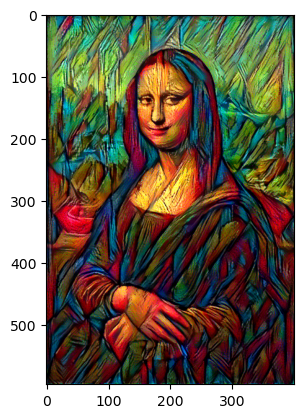

Step 1300, Total Loss: 19.909242630004883


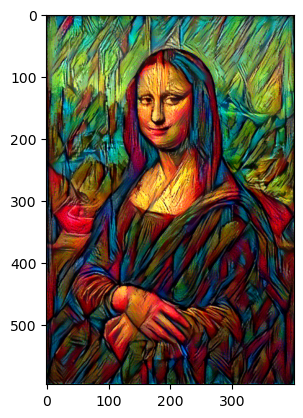

Step 1400, Total Loss: 19.666078567504883


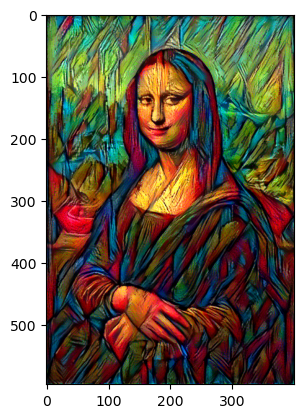

Step 1500, Total Loss: 19.438932418823242


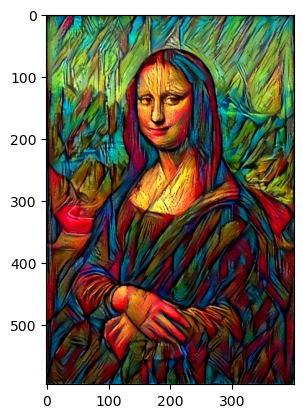

Step 1600, Total Loss: 19.226072311401367


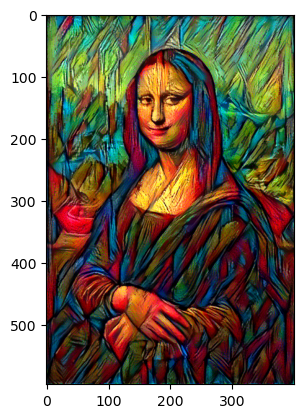

Step 1700, Total Loss: 19.027095794677734


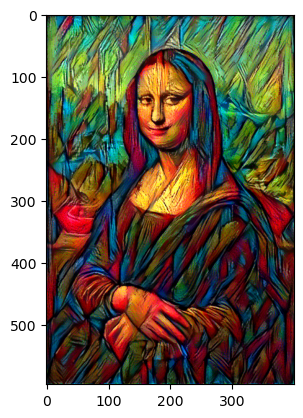

Step 1800, Total Loss: 18.839540481567383


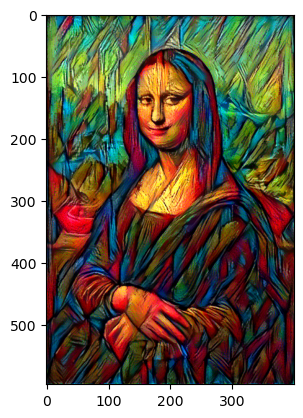

Step 1900, Total Loss: 18.663677215576172


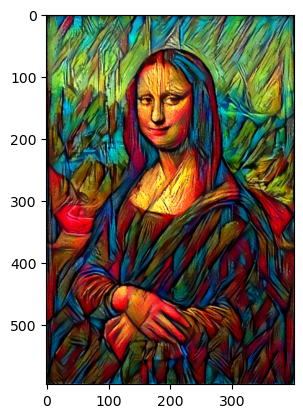

Step 2000, Total Loss: 18.498950958251953


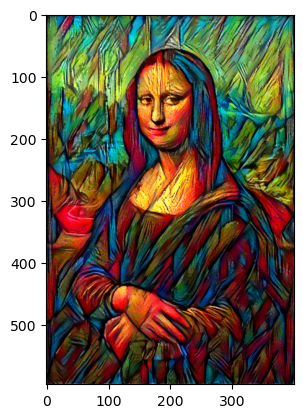

Step 2100, Total Loss: 18.34453773498535


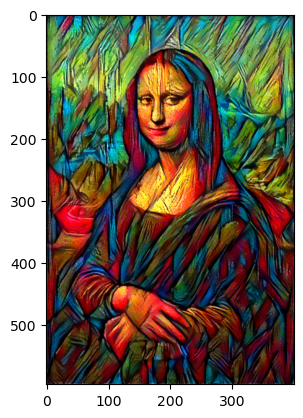

Step 2200, Total Loss: 18.19879150390625


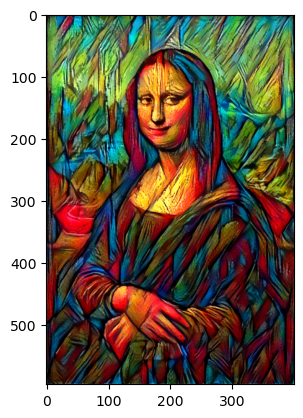

Step 2300, Total Loss: 18.061893463134766


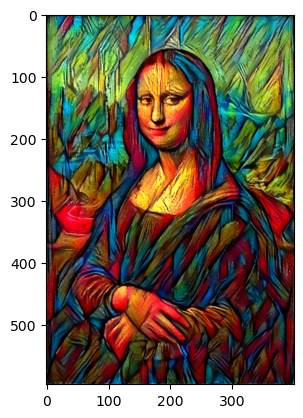

Step 2400, Total Loss: 17.933387756347656


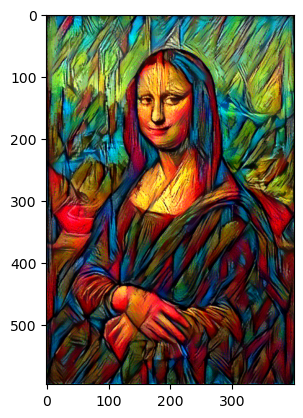

Step 2500, Total Loss: 17.812461853027344


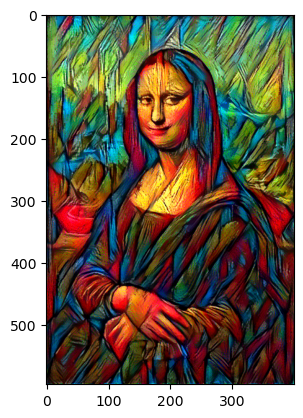

Step 2600, Total Loss: 17.697223663330078


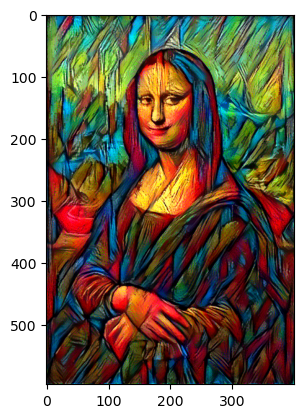

Step 2700, Total Loss: 17.58829116821289


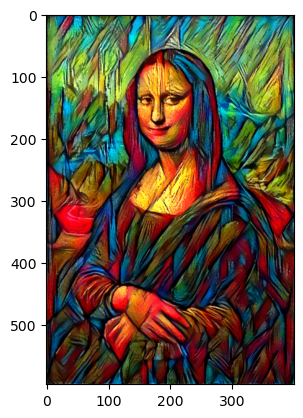

Step 2800, Total Loss: 17.484760284423828


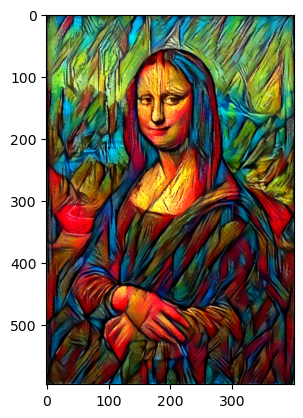

Step 2900, Total Loss: 17.386043548583984


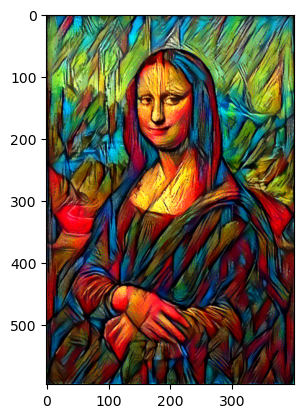

Step 3000, Total Loss: 17.292613983154297


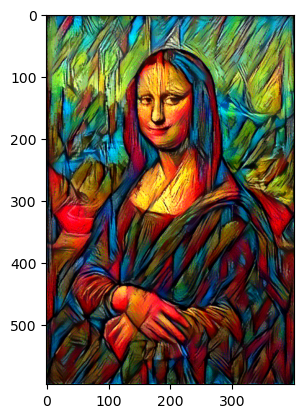

In [10]:

steps = 3000
for step in range(1, steps+1):

    target_features = get_features(target, vgg)
    

    content_loss = calculate_content_loss(target_features['conv4_2'], content_features['conv4_2'])
    

    style_loss = 0
    for layer in style_grams:
        target_feature = target_features[layer]
        style_gram = style_grams[layer]  # Use precomputed Gram matrix
        layer_style_loss = calculate_style_loss(target_feature, style_gram)
        style_loss += layer_style_loss
    
    style_loss *= style_weight
    content_loss *= content_weight
    

    total_loss = style_loss + content_loss
    

    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    

    if step % 100 == 0:
        print(f"Step {step}, Total Loss: {total_loss.item()}")
        plt.imshow(im_convert(target))
        plt.show()


### Displaying Style, Content, and Output Images for comparing

In this cell, we visualize the **content image**, **style image**, and **output image** side by side to compare the transformation process of the neural style transfer.

#### Breakdown of the Images:
1. **Content Image**: The original image, which provides the structure and subject matter that we want to preserve in the final output.
2. **Style Image**: The reference artwork from which the style (colors, textures, brush strokes) will be transferred onto the content image.
3. **Output Image**: The result of the neural style transfer process, where the content of the original image is combined with the style of the reference image.

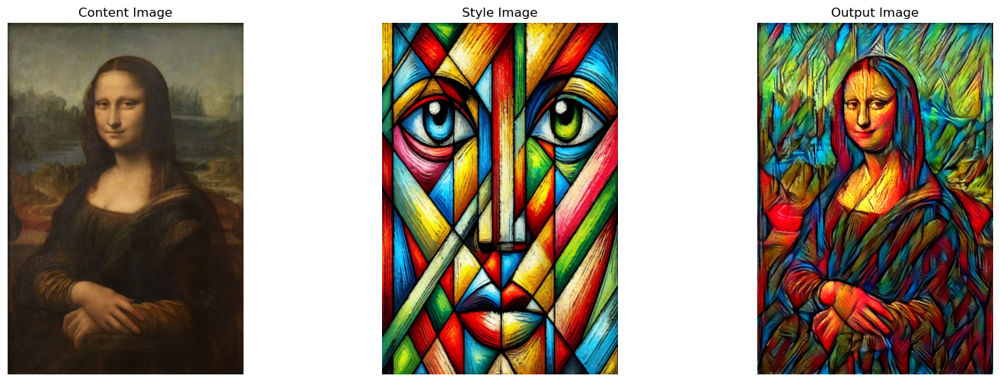

In [11]:
import matplotlib.pyplot as plt


def show_images(content_img, style_img, output_img):
    
    content_image = im_convert(content_img)
    style_image = im_convert(style_img)
    output_image = im_convert(output_img)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
  
    ax1.imshow(content_image)
    ax1.set_title("Content Image")
    ax1.axis("off")

   
    ax2.imshow(style_image)
    ax2.set_title("Style Image")
    ax2.axis("off")

    ax3.imshow(output_image)
    ax3.set_title("Output Image")
    ax3.axis("off")

    plt.show()

show_images(content_img, style_img, target)

Converts and displays the final target image after all training steps, then saves it to a file named `output_image_2.jpg`.


In [11]:
# Final output image
final_img = im_convert(target)
final_img.show()
final_img.save("output_image_2.jpg")